In [1]:
## do data cleaning first
import os
import pandas as pd
import numpy as np

# Specify the directories for the main data and labels
main_data_dir = 'onlineset/rosbag/data/data_clean'
label_data_dir = 'onlineset/rosbag/data/label'

# Initialize an empty DataFrame to hold the combined data
combined_df = pd.DataFrame()

counter = 0

def extract_global_features(df):
    features = {}
    for axis in ['Imu0_linear_accleration_x', 'Imu0_linear_accleration_y', 'Imu0_linear_accleration_z',
                  'Imu0_angular_velocity_x', 'Imu0_angular_velocity_y', 'Imu0_angular_velocity_z',
                  'Imu1_linear_accleration_x', 'Imu1_linear_accleration_y', 'Imu1_linear_accleration_z',
                  'Imu1_angular_velocity_x', 'Imu1_angular_velocity_y', 'Imu1_angular_velocity_z',
                  'Imu2_linear_accleration_x', 'Imu2_linear_accleration_y', 'Imu2_linear_accleration_z',
                  'Imu2_linear_accleration_x', 'Imu2_linear_accleration_y', 'Imu2_angular_velocity_z'
                    ]:
        df[f'{axis}_mean'] = df[axis].mean()
        df[f'{axis}_max'] = df[axis].max()
        df[f'{axis}_min'] = df[axis].min()
        df[f'{axis}_std'] = df[axis].std()
        df[f'{axis}_var'] = df[axis].var()
        df[f'{axis}_rms'] = np.sqrt(np.mean(df[axis]**2))
        df[f'{axis}_skew'] = df[axis].skew()
        df[f'{axis}_kurtosis'] = df[axis].kurtosis()
        df['csvfile'] = counter
    
    # Repeat similar feature extraction for angular velocity if available
    return pd.Series(features)

# Loop through each file in the main data directory
for filename in os.listdir(main_data_dir):
    if filename.endswith('.csv'):
        # Construct the file paths
        main_file_path = os.path.join(main_data_dir, filename)
        label_file_path = os.path.join(label_data_dir, filename.replace('_data.csv', '_label.csv'))
        
        # Read the main data and label files into DataFrames
        main_df = pd.read_csv(main_file_path)
        label_df = pd.read_csv(label_file_path,header=None)

        extract_global_features(main_df)
        counter += 1
        ##print(label_df)
        ##label_value = pd.read_csv(label_file_path).iloc[1, 0]
        label_value = label_df.iloc[1, 0]
        main_df['label'] = label_value
        
        # Append the combined DataFrame to the final DataFrame
        combined_df = pd.concat([combined_df, main_df], ignore_index=True)

# Display the first few rows of the combined DataFrame
combined_df.head()

C:\Users\leezh\AppData\Local\Temp\ipykernel_28540\1045384442.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{axis}_min'] = df[axis].min()
C:\Users\leezh\AppData\Local\Temp\ipykernel_28540\1045384442.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{axis}_std'] = df[axis].std()
C:\Users\leezh\AppData\Local\Temp\ipykernel_28540\1045384442.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all 

,timestamp,Imu0_linear_accleration_x,Imu0_linear_accleration_y,Imu0_linear_accleration_z,Imu0_angular_velocity_x,Imu0_angular_velocity_y,Imu0_angular_velocity_z,Imu0_orientation_x,Imu0_orientation_y,Imu0_orientation_z,...,Imu2_linear_accleration_z_kurtosis,Imu2_angular_velocity_z_mean,Imu2_angular_velocity_z_max,Imu2_angular_velocity_z_min,Imu2_angular_velocity_z_std,Imu2_angular_velocity_z_var,Imu2_angular_velocity_z_rms,Imu2_angular_velocity_z_skew,Imu2_angular_velocity_z_kurtosis,label
0,1.676012e+09,2.50,1.62,9.17,0.09,0.04,0.01,-0.126207,0.094461,-0.314152,...,0.491333,0.002,0.05,-0.11,0.027377,0.000749,0.027313,-1.549173,3.665348,0
1,1.676012e+09,2.45,1.63,9.17,0.10,0.04,0.00,-0.124434,0.093865,-0.314841,...,0.491333,0.002,0.05,-0.11,0.027377,0.000749,0.027313,-1.549173,3.665348,0
2,1.676012e+09,2.52,1.61,9.16,0.10,0.03,0.00,-0.124836,0.095980,-0.315462,...,0.491333,0.002,0.05,-0.11,0.027377,0.000749,0.027313,-1.549173,3.665348,0
3,1.676012e+09,2.49,1.55,9.14,0.11,0.02,0.01,-0.122590,0.097031,-0.316984,...,0.491333,0.002,0.05,-0.11,0.027377,0.000749,0.027313,-1.549173,3.665348,0
4,1.676012e+09,2.53,1.58,9.23,0.11,0.05,0.01,-0.121883,0.097969,-0.317809,...,0.491333,0.002,0.05,-0.11,0.027377,0.000749,0.027313,-1.549173,3.665348,0


In [2]:
print(combined_df.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84763 entries, 0 to 84762
Columns: 175 entries, timestamp to label
dtypes: float64(173), int64(1), object(1)
memory usage: 113.2+ MB
None 



In [3]:
print(combined_df['csvfile'].value_counts())

csvfile
379    272
336    264
343    258
337    256
334    253
      ... 
801     49
657     46
804     43
674     42
437     42
Name: count, Length: 810, dtype: int64


In [4]:
print(combined_df['label'].value_counts())

label
10    18761
0     10068
2      9841
3      9502
1      9432
4      9367
6      9105
5      8687
Name: count, dtype: int64


In [5]:
combined_df['label'] = combined_df['label'].astype(float)
combined_df['label'] = combined_df['label'].replace(10, 7)
print(combined_df.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84763 entries, 0 to 84762
Columns: 175 entries, timestamp to label
dtypes: float64(174), int64(1)
memory usage: 113.2 MB
None 



In [6]:
## testing to drop the time data column
combined_df.columns
df = combined_df.drop('timestamp', axis=1)
df.columns

Index(['Imu0_linear_accleration_x', 'Imu0_linear_accleration_y',
       'Imu0_linear_accleration_z', 'Imu0_angular_velocity_x',
       'Imu0_angular_velocity_y', 'Imu0_angular_velocity_z',
       'Imu0_orientation_x', 'Imu0_orientation_y', 'Imu0_orientation_z',
       'Imu0_orientation_w',
       ...
       'Imu2_linear_accleration_z_kurtosis', 'Imu2_angular_velocity_z_mean',
       'Imu2_angular_velocity_z_max', 'Imu2_angular_velocity_z_min',
       'Imu2_angular_velocity_z_std', 'Imu2_angular_velocity_z_var',
       'Imu2_angular_velocity_z_rms', 'Imu2_angular_velocity_z_skew',
       'Imu2_angular_velocity_z_kurtosis', 'label'],
      dtype='object', length=174)

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [8]:
class Model(nn.Module):
  # Input layer (4 features of the flower) -->
  # Hidden Layer1 (number of neurons) -->
  # H2 (n) -->
  # output (3 classes of iris flowers)
  def __init__(self, in_features=172, h1=32, h2=16, out_features=8):
    super().__init__() # instantiate our nn.Module
    self.fc1 = nn.Linear(in_features, h1)
    self.fc2 = nn.Linear(h1, h2)
    self.out = nn.Linear(h2, out_features)

  def forward(self, x):
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.out(x)

    return x

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline
model = Model()
X = df.drop('label', axis=1)
y = df['label']

In [10]:
X = X.values
y = y.values

In [11]:

from sklearn.model_selection import train_test_split

unique_groups = df['csvfile'].unique()
print(unique_groups)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

In [12]:
# Train Test Split
train_groups, temp_groups = train_test_split(unique_groups, test_size=0.5, random_state=42)
test_groups, val_groups = train_test_split(temp_groups, test_size=0.5, random_state=42)

# Filter the DataFrame based on the group assignments
train_df = df[df['csvfile'].isin(train_groups)]
test_df = df[df['csvfile'].isin(test_groups)]
val_df = df[df['csvfile'].isin(val_groups)]

train_df = train_df.drop('csvfile', axis=1)
test_df = test_df.drop('csvfile', axis=1)
val_df = val_df.drop('csvfile', axis=1)

X_train = train_df.drop('label', axis=1)
y_train = train_df['label']
X_validation = val_df.drop('label', axis=1)
y_validation = val_df['label']
X_test = test_df.drop('label', axis=1)
y_test = test_df['label']

print(f"X_train shape: {X_train.shape}")
print(f"X_validation shape: {X_validation.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_validation shape: {y_validation.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (41908, 172)
X_validation shape: (21964, 172)
X_test shape: (20891, 172)
y_train shape: (41908,)
y_validation shape: (21964,)
y_test shape: (20891,)


In [13]:
print(X_train.dtypes)

Imu0_linear_accleration_x           float64
Imu0_linear_accleration_y           float64
Imu0_linear_accleration_z           float64
Imu0_angular_velocity_x             float64
Imu0_angular_velocity_y             float64
                                     ...   
Imu2_angular_velocity_z_std         float64
Imu2_angular_velocity_z_var         float64
Imu2_angular_velocity_z_rms         float64
Imu2_angular_velocity_z_skew        float64
Imu2_angular_velocity_z_kurtosis    float64
Length: 172, dtype: object


In [14]:
# Convert X features to float tensors
X_train = torch.FloatTensor(X_train.values)
X_test = torch.FloatTensor(X_test.values)
X_validation = torch.FloatTensor(X_validation.values)

# Convert y labels to tensors long
y_train = torch.LongTensor(y_train.values)
y_test = torch.LongTensor(y_test.values)
y_validation = torch.LongTensor(y_validation.values)

In [15]:
# Set the criterion of model to measure the error, how far off the predictions are from the data
criterion = nn.CrossEntropyLoss()
# Choose Adam Optimizer, lr = learning rate (if error doesn't go down after a bunch of iterations (epochs), lower our learning rate)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [16]:
# Set the number of epochs
epochs = 100
losses = []
validation_losses = []

for i in range(epochs):
    # Training phase
    model.train()  # Set the model to training mode
    y_pred = model.forward(X_train)  # Forward pass with training data

    # Calculate training loss
    loss = criterion(y_pred, y_train)
    losses.append(loss.detach())  # Track the training loss

    # Backpropagation and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Validation phase
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # No need to track gradients during validation
        y_val_pred = model.forward(X_validation)  # Forward pass with validation data
        val_loss = criterion(y_val_pred, y_validation)  # Calculate validation loss
        validation_losses.append(val_loss.detach())  # Track the validation loss

    # Print losses every 10 epochs
    if i % 10 == 0:
        print(f'Epoch: {i} | Training Loss: {loss} | Validation Loss: {val_loss}')

Epoch: 0 | Training Loss: 2.112506866455078 | Validation Loss: 1.6130640506744385
Epoch: 10 | Training Loss: 0.22780732810497284 | Validation Loss: 0.1754746288061142
Epoch: 20 | Training Loss: 0.03324452415108681 | Validation Loss: 0.1116180419921875
Epoch: 30 | Training Loss: 0.005867682863026857 | Validation Loss: 0.07724469155073166
Epoch: 40 | Training Loss: 0.0013781242305412889 | Validation Loss: 0.07713188976049423
Epoch: 50 | Training Loss: 0.000723410164937377 | Validation Loss: 0.06381318718194962
Epoch: 60 | Training Loss: 0.00045285653322935104 | Validation Loss: 0.05757209286093712
Epoch: 70 | Training Loss: 0.00033933663507923484 | Validation Loss: 0.059915024787187576
Epoch: 80 | Training Loss: 0.00028143319650553167 | Validation Loss: 0.06213048845529556
Epoch: 90 | Training Loss: 0.00024491228396072984 | Validation Loss: 0.061855800449848175


In [17]:
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    y_test_pred = model.forward(X_test)  # Forward pass with test data
    test_loss = criterion(y_test_pred, y_test)  # Calculate test loss
    print(f'Test Loss: {test_loss}')
    
    # Optionally, calculate accuracy or other metrics
    _, predicted = torch.max(y_test_pred, 1)
    correct = (predicted == y_test).sum().item()
    accuracy = correct / y_test.size(0)
    print(f'Test Accuracy: {accuracy * 100:.2f}%')

Test Loss: 0.22408466041088104
Test Accuracy: 96.66%


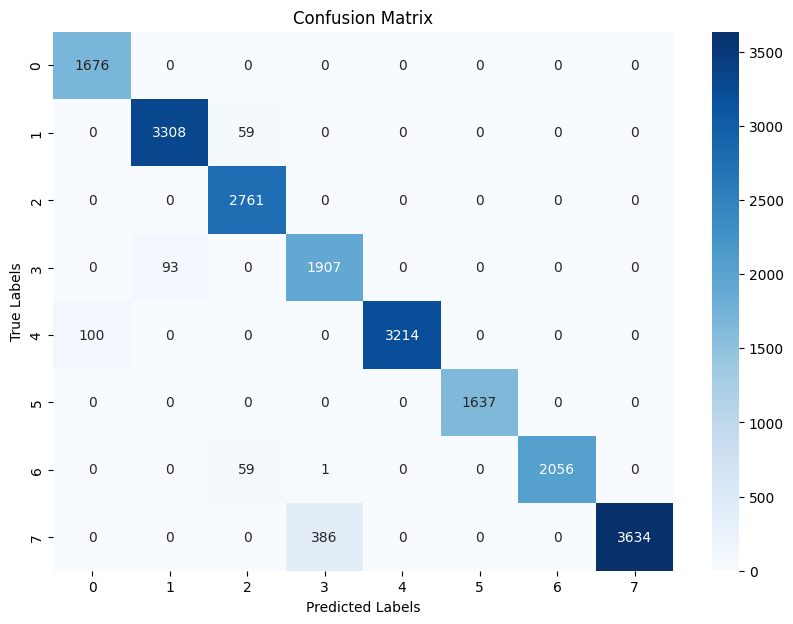

In [18]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_test_np = y_test.cpu().numpy()  # Convert to NumPy array if using GPU tensors
predicted_np = predicted.cpu().numpy()

cm = confusion_matrix(y_test_np, predicted_np)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [19]:
from sklearn.feature_selection import RFE

In [20]:
model

Model(
  (fc1): Linear(in_features=172, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=16, bias=True)
  (out): Linear(in_features=16, out_features=8, bias=True)
)

In [21]:
import torch
import shap


c:\Users\leezh\Documents\uni sem 7\cg4002\myenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [22]:
# Assuming model, X_train, and y_train are defined
# Convert PyTorch tensors to NumPy arrays if needed
X_train_np = X_train.detach().numpy()

# Define a wrapper function for the model
def model_wrapper(data):
    data_tensor = torch.from_numpy(data).float()
    return model(data_tensor).detach().numpy()

In [23]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Convert X_train and y_train to NumPy arrays if needed
X_train_np = X_train.detach().numpy()
y_train_np = y_train.detach().numpy()

# Define a logistic regression model as the estimator
estimator = LogisticRegression(max_iter=1000)

# Apply RFE to select top 10 features
selector = RFE(estimator, n_features_to_select=10, step=1)
selector = selector.fit(X_train_np, y_train_np)

# Get the top 10 features
top_10_features_rfe = np.where(selector.support_)[0]

print("Top 10 features (RFE):", top_10_features_rfe)

Top 10 features (RFE): [ 44  48  53  62  82 122 125 130 140 157]


In [24]:
# Assuming X_train, X_validation, X_test are your datasets and top_10_features_rfe is the list of selected features

# Select the top 10 features from the training, validation, and test sets
X_train_top10 = X_train[:, top_10_features_rfe]
X_validation_top10 = X_validation[:, top_10_features_rfe]
X_test_top10 = X_test[:, top_10_features_rfe]


In [41]:
class Model(nn.Module):
  # Input layer (4 features of the flower) -->
  # Hidden Layer1 (number of neurons) -->
  # H2 (n) -->
  # output (3 classes of iris flowers)
  def __init__(self, in_features=10, h1=32, h2=16, out_features=8):
    super().__init__() # instantiate our nn.Module
    self.fc1 = nn.Linear(in_features, h1)
    self.fc2 = nn.Linear(h1, h2)
    self.out = nn.Linear(h2, out_features)

  def forward(self, x):
    x = self.fc1(x)
    print("After fc1:", x)
    x = F.relu(x)
    print("After ReLU1:", x)
    x = self.fc2(x)
    print("After fc2:", x)
    x = F.relu(x)
    print("After ReLU2:", x)
    x = self.out(x)
    print("After output layer:", x)

    return x

In [42]:
model = Model()
# Set the criterion of model to measure the error, how far off the predictions are from the data
criterion = nn.CrossEntropyLoss()
# Choose Adam Optimizer, lr = learning rate (if error doesn't go down after a bunch of iterations (epochs), lower our learning rate)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [43]:
# Set the number of epochs
epochs = 100
losses = []
validation_losses = []

for i in range(epochs):
    # Training phase
    model.train()  # Set the model to training mode
    y_pred = model.forward(X_train_top10)  # Forward pass with training data

    # Calculate training loss
    loss = criterion(y_pred, y_train)
    losses.append(loss.detach())  # Track the training loss

    # Backpropagation and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Validation phase
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # No need to track gradients during validation
        y_val_pred = model.forward(X_validation_top10)  # Forward pass with validation data
        val_loss = criterion(y_val_pred, y_validation)  # Calculate validation loss
        validation_losses.append(val_loss.detach())  # Track the validation loss

    # Print losses every 10 epochs
    if i % 10 == 0:
        print(f'Epoch: {i} | Training Loss: {loss} | Validation Loss: {val_loss}')

After fc1: tensor([[-4.1395, -0.7237,  2.7473,  ..., -0.1153, -2.2529, -3.7059],
        [-4.1395, -0.7237,  2.7473,  ..., -0.1153, -2.2529, -3.7059],
        [-4.1395, -0.7237,  2.7473,  ..., -0.1153, -2.2529, -3.7059],
        ...,
        [-4.3977, -0.9474,  1.5748,  ..., -1.2541, -1.9108, -3.0517],
        [-4.3977, -0.9474,  1.5748,  ..., -1.2541, -1.9108, -3.0517],
        [-4.3977, -0.9474,  1.5748,  ..., -1.2541, -1.9108, -3.0517]],
       grad_fn=<AddmmBackward0>)
After ReLU1: tensor([[0.0000, 0.0000, 2.7473,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 2.7473,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 2.7473,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 1.5748,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.5748,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.5748,  ..., 0.0000, 0.0000, 0.0000]],
       grad_fn=<ReluBackward0>)
After fc2: tensor([[ 0.4075,  0.3225, -0.1430,  ...,  0.2595, -0.2358,  0.0536]

In [44]:
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    y_test_pred = model.forward(X_test_top10)  # Forward pass with test data
    test_loss = criterion(y_test_pred, y_test)  # Calculate test loss
    print(f'Test Loss: {test_loss}')
    
    # Optionally, calculate accuracy or other metrics
    _, predicted = torch.max(y_test_pred, 1)
    correct = (predicted == y_test).sum().item()
    accuracy = correct / y_test.size(0)
    print(f'Test Accuracy: {accuracy * 100:.2f}%')

After fc1: tensor([[-7.7334, -1.2536,  3.9324,  ...,  5.2885,  4.1170, -4.9133],
        [-7.7334, -1.2536,  3.9324,  ...,  5.2885,  4.1170, -4.9133],
        [-7.7334, -1.2536,  3.9324,  ...,  5.2885,  4.1170, -4.9133],
        ...,
        [-6.1726,  2.0524,  1.5746,  ..., -0.1020,  1.2361, -0.9374],
        [-6.1726,  2.0524,  1.5746,  ..., -0.1020,  1.2361, -0.9374],
        [-6.1726,  2.0524,  1.5746,  ..., -0.1020,  1.2361, -0.9374]])
After ReLU1: tensor([[0.0000, 0.0000, 3.9324,  ..., 5.2885, 4.1170, 0.0000],
        [0.0000, 0.0000, 3.9324,  ..., 5.2885, 4.1170, 0.0000],
        [0.0000, 0.0000, 3.9324,  ..., 5.2885, 4.1170, 0.0000],
        ...,
        [0.0000, 2.0524, 1.5746,  ..., 0.0000, 1.2361, 0.0000],
        [0.0000, 2.0524, 1.5746,  ..., 0.0000, 1.2361, 0.0000],
        [0.0000, 2.0524, 1.5746,  ..., 0.0000, 1.2361, 0.0000]])
After fc2: tensor([[ 9.6134, 17.6292, -1.4981,  ..., 10.7111, 16.4690, -5.6498],
        [ 9.6134, 17.6292, -1.4981,  ..., 10.7111, 16.4690, -5.

In [45]:
featurenames = df.columns
featurenames

Index(['Imu0_linear_accleration_x', 'Imu0_linear_accleration_y',
       'Imu0_linear_accleration_z', 'Imu0_angular_velocity_x',
       'Imu0_angular_velocity_y', 'Imu0_angular_velocity_z',
       'Imu0_orientation_x', 'Imu0_orientation_y', 'Imu0_orientation_z',
       'Imu0_orientation_w',
       ...
       'Imu2_linear_accleration_z_kurtosis', 'Imu2_angular_velocity_z_mean',
       'Imu2_angular_velocity_z_max', 'Imu2_angular_velocity_z_min',
       'Imu2_angular_velocity_z_std', 'Imu2_angular_velocity_z_var',
       'Imu2_angular_velocity_z_rms', 'Imu2_angular_velocity_z_skew',
       'Imu2_angular_velocity_z_kurtosis', 'label'],
      dtype='object', length=174)

In [46]:
# top_10_features_rfe is your list/array of selected feature indices
top_10_feature_names = featurenames[top_10_features_rfe]

# Print the selected feature names
print("Top 10 feature names (RFE):", top_10_feature_names)


Top 10 feature names (RFE): Index(['Imu0_linear_accleration_x_mean', 'Imu0_linear_accleration_x_var',
       'Imu0_linear_accleration_y_mean', 'Imu0_linear_accleration_z_max',
       'Imu0_angular_velocity_y_rms', 'Imu1_angular_velocity_x_rms',
       'Imu1_angular_velocity_y_mean', 'Imu1_angular_velocity_y_rms',
       'Imu1_angular_velocity_z_kurtosis', 'Imu2_linear_accleration_z_mean'],
      dtype='object')


In [47]:
correlation_matrix = df[top_10_feature_names].corr()
correlation_matrix

,Imu0_linear_accleration_x_mean,Imu0_linear_accleration_x_var,Imu0_linear_accleration_y_mean,Imu0_linear_accleration_z_max,Imu0_angular_velocity_y_rms,Imu1_angular_velocity_x_rms,Imu1_angular_velocity_y_mean,Imu1_angular_velocity_y_rms,Imu1_angular_velocity_z_kurtosis,Imu2_linear_accleration_z_mean
Imu0_linear_accleration_x_mean,1.000000,0.055552,-0.043402,-0.229876,0.122729,0.383028,-0.004750,-0.200983,-0.422286,0.660310
Imu0_linear_accleration_x_var,0.055552,1.000000,-0.253944,0.355973,0.447621,0.326569,0.209210,0.267407,-0.062526,-0.011035
Imu0_linear_accleration_y_mean,-0.043402,-0.253944,1.000000,-0.276668,0.275250,0.185292,-0.013669,0.296365,0.055009,-0.320812
Imu0_linear_accleration_z_max,-0.229876,0.355973,-0.276668,1.000000,0.440673,0.117957,0.049296,0.256968,0.114236,-0.138701
Imu0_angular_velocity_y_rms,0.122729,0.447621,0.275250,0.440673,1.000000,0.572776,0.066955,0.722698,-0.028485,-0.095051
Imu1_angular_velocity_x_rms,0.383028,0.326569,0.185292,0.117957,0.572776,1.000000,0.288254,0.592698,-0.160437,0.254701
Imu1_angular_velocity_y_mean,-0.004750,0.209210,-0.013669,0.049296,0.066955,0.288254,1.000000,0.144271,0.043451,0.104071
Imu1_angular_velocity_y_rms,-0.200983,0.267407,0.296365,0.256968,0.722698,0.592698,0.144271,1.000000,0.111753,-0.142996
Imu1_angular_velocity_z_kurtosis,-0.422286,-0.062526,0.055009,0.114236,-0.028485,-0.160437,0.043451,0.111753,1.000000,-0.196748
Imu2_linear_accleration_z_mean,0.660310,-0.011035,-0.320812,-0.138701,-0.095051,0.254701,0.104071,-0.142996,-0.196748,1.000000


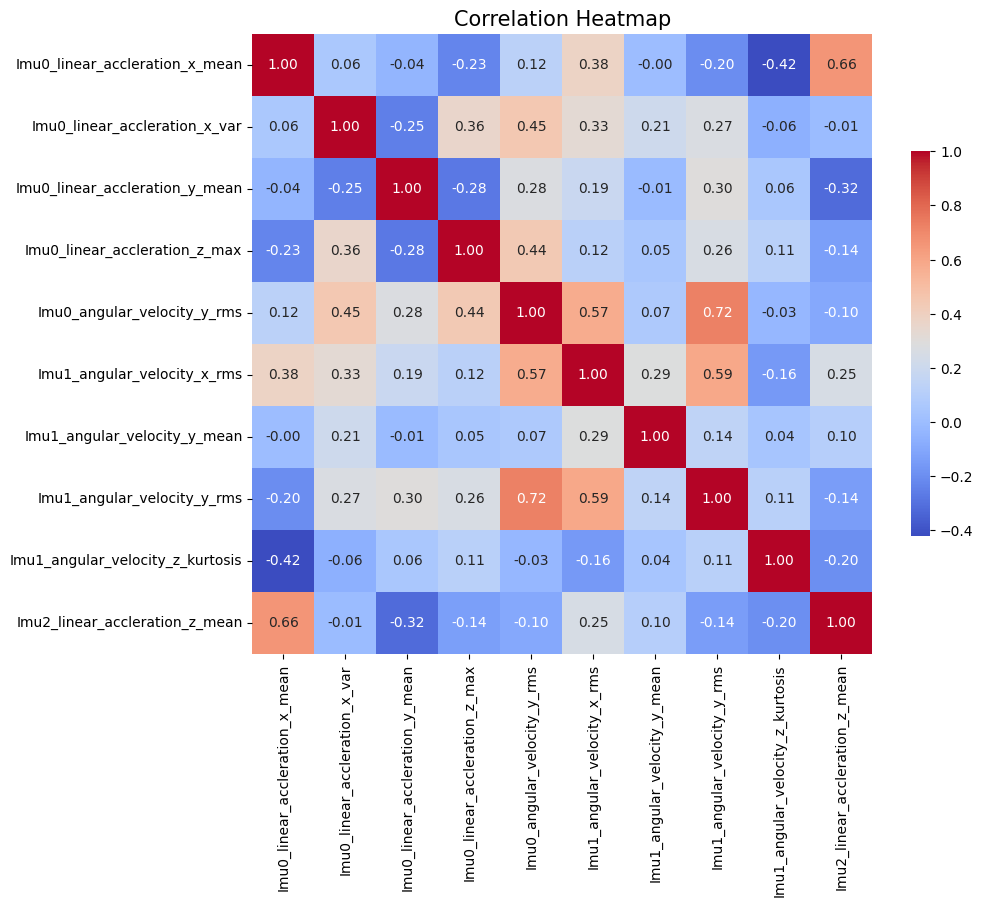

In [48]:
# Set up the matplotlib figure
plt.figure(figsize=(10, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .5})

# Set title for the heatmap
plt.title('Correlation Heatmap', fontsize=15)

# Display the plot
plt.show()

In [49]:
## The 10 features selected are not that closely related

In [34]:
import torch
input_tensor = torch.randn(1, 10) 
# Assuming `model` is your trained PyTorch model and `input_tensor` is an example input
torch.onnx.export(model, input_tensor, "model.onnx", export_params=True, opset_version=10)


In [50]:
from torch import nn

for layer in model.children():
    if isinstance(layer, nn.Linear):
        print("Weight: " )
        print(layer.state_dict()['weight'])
        print("Bias: " )
        print(layer.state_dict()['bias'])

Weight: 
tensor([[ 0.2011,  0.2100, -0.2233, -0.3567,  0.1343,  0.4078, -0.0573,  0.3711,
          0.4625, -0.0453],
        [-0.2986, -0.5342,  0.2383, -0.2608, -0.6696, -0.6962,  0.2462, -0.1295,
          0.0284,  0.2045],
        [ 0.2068,  0.1978,  0.1749,  0.1854, -0.5731, -0.3023,  0.1883, -0.5321,
         -0.1231,  0.4197],
        [-0.2992,  0.2205,  0.0785, -0.2916, -0.0468, -0.0016,  0.5312, -0.0972,
         -0.1248,  0.3400],
        [ 0.6275,  0.1118,  0.2182,  0.4548, -0.0730, -0.4552,  0.0945, -0.2457,
          0.2070, -0.0902],
        [ 0.3828,  0.1729,  0.3211, -0.2547,  0.2817,  0.1934,  0.3513,  0.4902,
          0.3166,  0.3754],
        [-0.2368, -0.0056,  0.4160,  0.3283,  0.6386, -0.6012, -0.2585,  0.0300,
          0.4081,  0.2536],
        [ 0.1111,  0.0608,  0.0669, -0.3486, -0.4792, -0.1313, -0.0986, -0.2271,
         -0.5653,  0.1161],
        [-0.0849, -0.4784,  0.0166,  0.3975, -0.5004,  0.4487,  0.1396,  0.3478,
         -0.2014,  0.3142],
        [-

In [51]:
import torch
from torch import nn

# Assuming 'model' is your MLP model
for i, layer in enumerate(model.children()):
    if isinstance(layer, nn.Linear):
        # Get weights and biases
        weights = layer.state_dict()['weight'].cpu().numpy()
        biases = layer.state_dict()['bias'].cpu().numpy()
        
        # Define file names
        weight_filename = f'layer_{i}_weights.txt'
        bias_filename = f'layer_{i}_biases.txt'
        
        # Save weights to file
        with open(weight_filename, 'w') as f:
            for row in weights:
                f.write(' '.join(map(str, row)) + '\n')
        
        # Save biases to file
        with open(bias_filename, 'w') as f:
            f.write(' '.join(map(str, biases)) + '\n')
        
        print(f'Saved weights to {weight_filename}')
        print(f'Saved biases to {bias_filename}')

Saved weights to layer_0_weights.txt
Saved biases to layer_0_biases.txt
Saved weights to layer_1_weights.txt
Saved biases to layer_1_biases.txt
Saved weights to layer_2_weights.txt
Saved biases to layer_2_biases.txt


In [52]:
sampleinputdata = df[featurenames[top_10_features_rfe]]
sampleinputdata

,Imu0_linear_accleration_x_mean,Imu0_linear_accleration_x_var,Imu0_linear_accleration_y_mean,Imu0_linear_accleration_z_max,Imu0_angular_velocity_y_rms,Imu1_angular_velocity_x_rms,Imu1_angular_velocity_y_mean,Imu1_angular_velocity_y_rms,Imu1_angular_velocity_z_kurtosis,Imu2_linear_accleration_z_mean
0,2.428600,0.003962,1.682600,9.32,0.031000,0.071610,-0.127600,0.127953,14.904365,0.290300
1,2.428600,0.003962,1.682600,9.32,0.031000,0.071610,-0.127600,0.127953,14.904365,0.290300
2,2.428600,0.003962,1.682600,9.32,0.031000,0.071610,-0.127600,0.127953,14.904365,0.290300
3,2.428600,0.003962,1.682600,9.32,0.031000,0.071610,-0.127600,0.127953,14.904365,0.290300
4,2.428600,0.003962,1.682600,9.32,0.031000,0.071610,-0.127600,0.127953,14.904365,0.290300
...,...,...,...,...,...,...,...,...,...,...
84758,-6.624742,0.736009,5.314845,6.66,0.359828,0.310027,-0.433093,1.072423,17.245576,-0.153402
84759,-6.624742,0.736009,5.314845,6.66,0.359828,0.310027,-0.433093,1.072423,17.245576,-0.153402
84760,-6.624742,0.736009,5.314845,6.66,0.359828,0.310027,-0.433093,1.072423,17.245576,-0.153402
84761,-6.624742,0.736009,5.314845,6.66,0.359828,0.310027,-0.433093,1.072423,17.245576,-0.153402


In [53]:
featurenames[top_10_features_rfe]

Index(['Imu0_linear_accleration_x_mean', 'Imu0_linear_accleration_x_var',
       'Imu0_linear_accleration_y_mean', 'Imu0_linear_accleration_z_max',
       'Imu0_angular_velocity_y_rms', 'Imu1_angular_velocity_x_rms',
       'Imu1_angular_velocity_y_mean', 'Imu1_angular_velocity_y_rms',
       'Imu1_angular_velocity_z_kurtosis', 'Imu2_linear_accleration_z_mean'],
      dtype='object')

In [54]:
model.eval()

Model(
  (fc1): Linear(in_features=10, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=16, bias=True)
  (out): Linear(in_features=16, out_features=8, bias=True)
)

In [55]:
import torch

# Convert input data to a PyTorch tensor
input_data = torch.tensor([[2.428600, 0.003962, 1.682600, 9.32, 0.031000, 0.071610, -0.127600, 0.127953, 14.904365, 0.290300]], dtype=torch.float32)

# Ensure the model is in evaluation mode
model.eval()

# Disable gradient calculations for inference
with torch.no_grad():
    # Perform a forward pass
    output = model(input_data)

# Print the output
print(output)


After fc1: tensor([[  3.7501,  -2.2422,   0.7443,  -5.3283,   9.5310,   4.1865,   9.7948,
         -11.1442,   0.8953,   2.3927,   0.0444,   0.0709,  11.9066,  -2.1779,
           2.7733,   2.5453,  -1.9848,   7.4199,   0.5680,   4.7786,   1.8953,
           2.5423,   1.6244,   2.0285,  -1.6510,  -1.1397,  -7.7688,  -9.2502,
           4.5566,   4.4267,  -0.1013,  -2.2116]])
After ReLU1: tensor([[ 3.7501,  0.0000,  0.7443,  0.0000,  9.5310,  4.1865,  9.7948,  0.0000,
          0.8953,  2.3927,  0.0444,  0.0709, 11.9066,  0.0000,  2.7733,  2.5453,
          0.0000,  7.4199,  0.5680,  4.7786,  1.8953,  2.5423,  1.6244,  2.0285,
          0.0000,  0.0000,  0.0000,  0.0000,  4.5566,  4.4267,  0.0000,  0.0000]])
After fc2: tensor([[ -5.3627,  13.1699,   4.3610,  21.2602,  -1.0009,  13.5471,  11.1000,
          -6.8667,  11.6826,  -2.7040,  -1.5767, -11.0018,  -5.3929,   6.5551,
          14.6333,  -1.5389]])
After ReLU2: tensor([[ 0.0000, 13.1699,  4.3610, 21.2602,  0.0000, 13.5471, 11.1000

In [ ]:
featurenames = df.columns
featurenames